# Ingest

In [1]:
from notebook_utils import *

# print modules and versions            
imports()

/home/ubuntu/py_36_env/lib/python3.6/site-packages/anndata/core/anndata.py:17: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/home/ubuntu/py_36_env/lib/python3.6/site-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning


pandas: 1.0.3
numpy: 1.18.2
scanpy.api: 1.4.4.post1
anndata: 0.6.22rc1
plotnine: 0.6.0
scipy: 1.4.1
more_itertools: 8.2.0
tqdm: 4.45.0
sklearn: 0.22.2.post1
lifelines: 0.24.3
matplotlib: 3.0.3


In [2]:
# import adata and associated files
wkdir = '/home/ubuntu/data/DL20181011_melanocyte_test_data/local_data'

for file in ['raw_adata', 
             'full_adata',
             'DE_df',
            ]:
    var = pickle.load((open(f'{wkdir}/{file}.p', 'rb')))
    exec(f'{file} = var')
    del var
    
# for parallel processes
usable_cores = multiprocessing.cpu_count()-1

# update subtypes
full_adata.obs['subtypes'] = ['follicular' if x in ['light_foll_mel', 'dark_foll_mel', 'cyc_foll_mel'] \
                         else y \
                         for x,y in zip(full_adata.obs.class_1, full_adata.obs.subtypes)]

# label order
dev_stage_order = ['fet','neo','adt']
subtypes_order = ['cutaneous','acral','foreskin','follicular']
acral_subtype_order = ['acral','not_acral']
foreskin_subtype_order = ['foreskin','not_foreskin']
follicular_subtype_order = ['follicular','not_follicular']
dev_subtype_order = ['fet_acral','fet_cutaneous','fet_follicular','neo_foreskin','adt_acral','adt_cutaneous']

# create class_2 for site granularity
full_adata.obs['class_2'] = [x if x not in ['mel'] \
                             else f'{y}_mel'
                             for x,y in zip(full_adata.obs['class_1'], full_adata.obs['subtypes'])]

# create class_3 for site+dev_stage granularity
full_adata.obs['class_3'] = [x if not x.endswith('_mel') or x.startswith('cyc_') \
                             else f'{y}_{x}'
                             for x,y in zip(full_adata.obs['class_2'], full_adata.obs['dev_stage'])]

# update class_1 to pool by cell type
full_adata.obs['class_1'] = [x if not x.endswith('_mel') \
                             else 'mel' if not x.startswith('cyc_') \
                             else 'cyc_mel' \
                             for x in full_adata.obs['class_1']]
type_order_1 = ['mel',
                'cyc_mel',
                'krt',
                'cyc_krt',
                'eccrine',
                'cyc_eccrine',
                'dendritic',
                'cyc_dendritic',
                'mast',
                'T_cell',]
    
DE_df['class_1'] = (DE_df['class_1']
                      .astype(str)
                      .astype(CategoricalDtype(type_order_1, ordered=True))
                     )
DE_df = DE_df.dropna()

type_order_2 = ['light_foll_mel',
                'dark_foll_mel',
                'foreskin_mel',
                'acral_mel',
                'cutaneous_mel',
                'cyc_foll_mel',
                'cyc_mel',
                'krt',
                'cyc_krt',
                'eccrine',
                'cyc_eccrine',
                'dendritic',
                'cyc_dendritic',
                'mast',
                'T_cell',]

type_order_3 = ['adt_cutaneous_mel',
                'adt_acral_mel',
                'neo_foreskin_mel',
                'fet_cutaneous_mel',
                'fet_acral_mel',
                'fet_dark_foll_mel',
                'fet_light_foll_mel',][::-1] + \
                ['cyc_mel',
                'cyc_foll_mel',
                'krt',
                'cyc_krt',
                'eccrine',
                'cyc_eccrine',
                'dendritic',
                'cyc_dendritic',
                'mast',
                'T_cell',]


# Module_4.1: bulk melanoma

## TCGA survival outcomes

In [3]:
# melanoma files
counts_table = f'{wkdir}/TCGA-SKCM.htseq_fpkm-uq.tsv'
clinical_outcomes = f'{wkdir}/tcga_metadata.csv'
gene_conversion = f'{wkdir}/gencode.v22.annotation.gene.probeMap'
group = 'skcm'
# fn_dict = {'tcga_df_fltr':f'/home/ubuntu/data/DL20181011_melanocyte_test_data/tcga_{group}_counts.csv',
#                'tcga_meta_ordered':f'/home/ubuntu/data/DL20181011_melanocyte_test_data/tcga_{group}_metadata.csv'
#               }

# Protocol:
    # download counts table: https://gdc.xenahubs.net/download/TCGA-SKCM/Xena_Matrices/TCGA-SKCM.htseq_fpkm-uq.tsv.gz
    # units = log2(norm_count+1)
    # gunzip file

import json, os, glob, tqdm, mygene
import pandas as pd



# ingest counts table
tcga_df = pd.read_csv(counts_table, sep = '\t').rename(columns = {'Ensembl_ID':'id'})

# ingest ensembl to symbol conversion table
ens2sym_df = (pd.read_csv(gene_conversion, sep = '\t', index_col = 0)
              .reset_index()
              .loc[:,['gene','id']]
             )

# merge symbols and drop ensembl and multi-loci genes
tcga_df = (pd.merge(tcga_df, ens2sym_df, 'left', 'id')
           .drop('id', axis = 1)
           .dropna()
           .set_index('gene')
          )
tcga_df = tcga_df[~tcga_df.index.duplicated('first')]

# transpose and create bcr column
tcga_df_fltr = tcga_df.T.reset_index().rename(columns = {'index':'submitter_id'})
tcga_df_fltr['bcr_patient_barcode'] = ['-'.join(x.split('-')[:3]) for x in tcga_df_fltr['submitter_id']]

# align metadata
## ref = https://www.sciencedirect.com/science/article/pii/S0092867418302290#mmc1
tcga_meta = pd.read_csv(clinical_outcomes,index_col=0)
tcga_meta_ordered = pd.merge(tcga_df_fltr.loc[:,'bcr_patient_barcode'],
                                 tcga_meta,
                                 'left',
                                 'bcr_patient_barcode'
                                )
# drop duplicate records
tcga_meta_ordered = tcga_meta_ordered[~tcga_meta_ordered.bcr_patient_barcode.duplicated('first')]

# append primary vs secondary site
origin_filter = pd.read_csv(f'{wkdir}/tissue_origin.csv')
origin_filter = origin_filter[~origin_filter.submitter_id.duplicated('first')]
origin_filter['site'] = ['primary' if x.lower().find('skin') != -1 else 'secondary' \
                     for x in origin_filter.tissue_origin.tolist()]
origin_filter['bcr_patient_barcode'] = ['-'.join(x.split('-')[:3]) for x in origin_filter['submitter_id']]
tcga_meta_ordered = pd.merge(tcga_meta_ordered,
                             origin_filter.loc[:,['site','bcr_patient_barcode']],
                             'left',
                             'bcr_patient_barcode'
                            )

#     # write dfs to csv and push to s3
#     tcga_df_fltr = tcga_df_fltr.drop('bcr_patient_barcode', axis = 1).set_index('submitter_id').T
#     for key,value in fn_dict.items():
#         eval(key).to_csv(value)
#         ! aws s3 cp {value} s3://{s3dir}/
        

In [4]:
# pull tables from s3
# for key,value in fn_dict.items():
#     value_fn = value.split('/')[-1]
#     exec(f'{key} = pd.read_csv("s3://{s3dir}/{value_fn}", index_col = 0)')
    
### SKCM-specific metadata processing ###

# update stage codes
stage2code = {'I/II NOS':np.nan,
             'Stage 0':0,
             'Stage I':1,
             'Stage IA':1,
             'Stage IB':1,
             'Stage II':2,
             'Stage IIA':2,
             'Stage IIB':2,
             'Stage IIC':2,
             'Stage III':3,
             'Stage IIIA':3,
             'Stage IIIB':3,
             'Stage IIIC':3,
             'Stage IV':4,
             '[Not Available]':np.nan}
tcga_meta_ordered['stage_code'] = [stage2code.get(x) for x in tcga_meta_ordered['ajcc_pathologic_tumor_stage']]
display(tcga_meta_ordered.head(), tcga_df_fltr.head())

grouped_dict = {'fet_light_foll_mel':'0',
                'fet_dark_foll_mel':'0',
                'fet_cutaneous_mel':'1',
                'neo_foreskin_mel':'2',
                'adt_cutaneous_mel':'3',
               }
targets = sorted(list(set(grouped_dict.values())))

target_dict = {'0':'fetal_follicular',
               '1':'fetal_interfollicular',
               '2':'neonatal_interfollicular',
               '3':'adult_interfollicular',
              }


,bcr_patient_barcode,type,age_at_initial_pathologic_diagnosis,gender,race,ajcc_pathologic_tumor_stage,clinical_stage,histological_type,histological_grade,initial_pathologic_dx_year,...,OS.time,DSS,DSS.time,DFI,DFI.time,PFI,PFI.time,Redaction,site,stage_code
0,TCGA-3N-A9WB,SKCM,71.0,MALE,WHITE,Stage IA,[Not Applicable],NaN,[Not Available],2012.0,...,518.0,1.0,518.0,NaN,NaN,1.0,426.0,NaN,primary,1.0
1,TCGA-3N-A9WC,SKCM,82.0,MALE,WHITE,Stage IIA,[Not Applicable],NaN,[Not Available],2009.0,...,2022.0,0.0,2022.0,NaN,NaN,1.0,1705.0,NaN,secondary,2.0
2,TCGA-3N-A9WD,SKCM,82.0,MALE,WHITE,Stage IIIA,[Not Applicable],NaN,[Not Available],2013.0,...,395.0,1.0,395.0,NaN,NaN,1.0,306.0,NaN,secondary,3.0
3,TCGA-BF-A1PU,SKCM,46.0,FEMALE,WHITE,Stage IIC,[Not Applicable],NaN,[Not Available],2010.0,...,387.0,0.0,387.0,NaN,NaN,1.0,484.0,NaN,primary,2.0
4,TCGA-BF-A1PV,SKCM,74.0,FEMALE,WHITE,Stage IIC,[Not Applicable],NaN,[Not Available],2010.0,...,14.0,0.0,14.0,NaN,NaN,0.0,14.0,NaN,primary,2.0


gene,submitter_id,RP11-368I23.2,RP11-742D12.2,RAB4B,AC104183.2,C12orf5,RNF44,NUP210P2,DNAH3,RPL23A,...,CYP4F2,RP11-486E2.1,AC010525.4,RP11-713D19.1,PPP6R1,RP4-569M23.2,AC009260.1,BATF3,OR8D4,bcr_patient_barcode
0,TCGA-3N-A9WB-06A,0.000000,0.000000,17.366542,0.0,17.690954,17.166949,0.0,6.536363,22.529738,...,0.000000,0.0,11.020655,10.071228,18.726475,10.984331,0.0,14.991424,0.0,TCGA-3N-A9WB
1,TCGA-3N-A9WC-06A,0.000000,8.001965,16.552792,0.0,16.930580,17.756216,0.0,6.465010,21.368681,...,0.000000,0.0,11.533260,0.000000,18.923093,13.269167,0.0,15.885217,0.0,TCGA-3N-A9WC
2,TCGA-3N-A9WD-06A,13.493991,0.000000,16.634705,0.0,16.988749,17.897510,0.0,9.339954,21.927900,...,0.000000,0.0,12.306722,10.772225,18.620865,12.592257,0.0,14.422430,0.0,TCGA-3N-A9WD
3,TCGA-BF-A1PU-01A,0.000000,0.000000,17.221413,0.0,18.242537,18.063839,0.0,7.472527,22.153057,...,0.000000,0.0,0.000000,9.792766,19.689063,8.708325,0.0,12.477980,0.0,TCGA-BF-A1PU
4,TCGA-BF-A1PV-01A,0.000000,0.000000,15.646205,0.0,17.815978,17.850836,0.0,7.256287,21.526660,...,6.704717,0.0,10.524632,10.574524,18.717343,8.491325,0.0,13.052531,0.0,TCGA-BF-A1PV


### cibersort inputs

In [5]:
print('computing...')
date_val = '20200415'
create_cibersort_inputs = False

if create_cibersort_inputs == True:
    # create class_4 for model variables
    input_adata = full_adata[[x in grouped_dict.keys() for x in full_adata.obs['class_3']]]
    print(set(input_adata.obs['class_3']))

    input_adata.obs['class_4'] = [target_dict.get(grouped_dict.get(x)) for x in input_adata.obs['class_3']]
    print(set(input_adata.obs['class_4']))
    groupby = 'class_4'    
    
    cell_n = len(input_adata[input_adata.obs['class_4']=='fetal_follicular'])

    # inner join gene lists
    genes_intersect = sorted(list((set(input_adata.var_names) & set(tcga_df_fltr.index))))

    # filter
    _, df = prepare_dataframe(input_adata,
                                genes_intersect,
                                'cell'
                             )
    df[groupby] = input_adata.obs[groupby].values
    df = df.dropna()

    # subsample
    master_df = pd.DataFrame()
    for x in ['fetal_follicular', 'fetal_interfollicular', 'neonatal_interfollicular', 'adult_interfollicular',]:
        df_slice = df[df[groupby]==x]
        if len(df_slice) > cell_n:
            df_slice = df_slice.sample(frac=1,
                                       random_state=100
                                      ).iloc[:cell_n,:]
        master_df = master_df.append(df_slice)

    # pheno table
    print('pheno table...')
    pheno_df = pd.DataFrame(master_df.loc[:,groupby])
    for x in set(df[groupby]):
        pheno_df[x] = [1 if name == x else 2 for name in pheno_df[groupby]]

    pheno_df = pheno_df.drop(groupby, axis = 1).T
    pheno_fn = f'{wkdr}/DL{date_val}_pheno_matrix.tsv'
    pheno_df.to_csv(pheno_fn,
                    sep = '\t', 
                    header = False
                     )

#     # ref table
#     print('ref table...')
#     master_df = master_df.drop(groupby, axis=1)
#     master_df = np.exp(master_df.T)-1
#     master_df = master_df.astype(int)
#     master_fn = f'/home/ubuntu/data/DL20181011_melanocyte_test_data/DL{date_val}_ref_matrix.tsv'
#     master_df.to_csv(master_fn,
#               sep = '\t', 
#              header = True
#              )
#     ! aws s3 cp {master_fn} s3://{s3dir}/

    # mixture table
    print('mixture table...')
    tcga_df = 2**tcga_df_fltr.loc[master_df.index.tolist(),:]-1 # transform from log2(norm_count+1)
    tcga_df = tcga_df.astype(int)
    tcga_fn = f'{wkdr}/DL{date_val}_tcga_matrix.tsv'
    tcga_df.to_csv(tcga_fn,
                  sep = '\t',
                   header=True
                 )
        
    ### for k-fold cross-validation ###


     # create class_4 for model variables
    input_adata = full_adata[[x in grouped_dict.keys() for x in full_adata.obs['class_3']]]
    print(set(input_adata.obs['class_3']))

    input_adata.obs['class_4'] = [target_dict.get(grouped_dict.get(x)) for x in input_adata.obs['class_3']]
    print(set(input_adata.obs['class_4']))
    groupby = 'class_4'    

    cell_n = len(input_adata[input_adata.obs['class_4']=='fetal_follicular'])

    # inner join gene lists
    genes_intersect = sorted(list((set(input_adata.var_names) & set(tcga_df_fltr.index))))

    # filter
    _, df = prepare_dataframe(input_adata,
                                genes_intersect,
                                'cell'
                             )
    df[groupby] = input_adata.obs[groupby].values
    df = df.dropna()
    df = df.sample(frac=1,random_state=100)

    # subsample

    for idx, interval in enumerate(range(10)):
        start = interval * cell_n
        end = start + cell_n
        master_df = df[df[groupby]=='fetal_follicular']

        for x in ['fetal_interfollicular', 'neonatal_interfollicular', 'adult_interfollicular',]:
            df_slice = df[df[groupby]==x]
            master_df = master_df.append(df_slice.iloc[start:end,:])

        master_df = master_df.drop(groupby, axis=1)
        master_df = np.exp(master_df.T)-1
        master_df = master_df.astype(int)
        master_fn = f'{wkdr}/DL{date_val}_ref_matrix_{idx}.tsv'
        master_df.to_csv(master_fn,
                  sep = '\t', 
                 header = True
                 )


computing...


In [6]:
# k-fold summary label
master_ciber_df = pd.DataFrame()
for x in range(1,11,1):
    ciber_df = pd.read_csv(f's3://daniel.le-work/MEL_project/DL20200415_cs{x}.csv')
    ciber_df = (ciber_df
                .rename(columns = {'Input Sample':'submitter_id'})
                .loc[:,['submitter_id','neonatal_interfollicular','fetal_interfollicular','adult_interfollicular','fetal_follicular']]
               )
    ciber_df = pd.melt(ciber_df, id_vars='submitter_id')
    ciber_df['idx'] = x
    master_ciber_df = master_ciber_df.append(ciber_df)
    
master_ciber_df = (master_ciber_df
                   .groupby(['submitter_id','variable'])['value']
                   .mean()
                   .reset_index()
                  )
master_ciber_df = (master_ciber_df
                   .pivot(index='submitter_id', columns='variable', values='value')
                  )
    
master_ciber_df['sum'] = master_ciber_df.sum(axis=1)
for y in ['neonatal_interfollicular','fetal_interfollicular','adult_interfollicular','fetal_follicular']:
    master_ciber_df[y] = (master_ciber_df[y]/master_ciber_df['sum'])
master_ciber_df = master_ciber_df.drop('sum', axis=1)
    
ciber_df = master_ciber_df.reset_index()

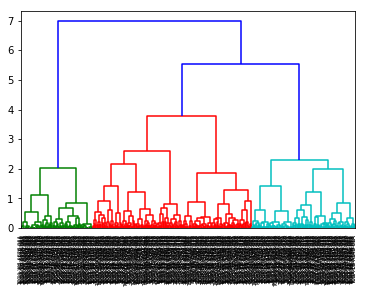

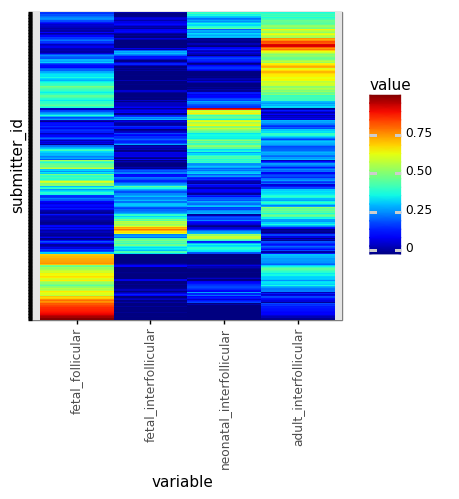

<ggplot: (-9223363254162496014)>


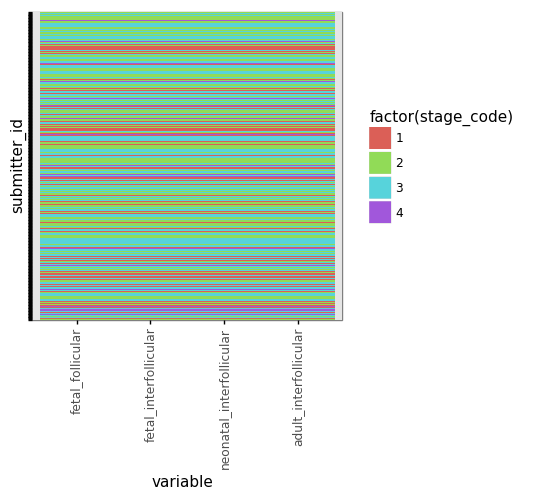

<ggplot: (-9223363254162498567)>


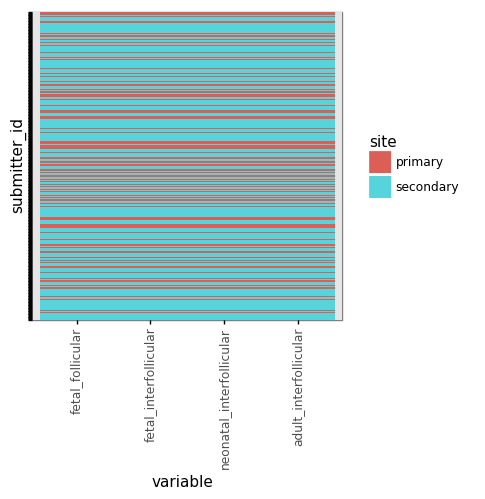

<ggplot: (-9223363254163053985)>


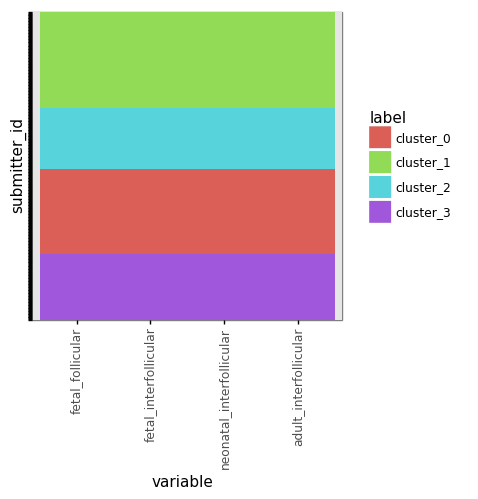

<ggplot: (-9223363254162369806)>
cluster_2
cluster_3
cluster_0
cluster_1


/home/ubuntu/py_36_env/lib/python3.6/site-packages/ipykernel_launcher.py:79: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ubuntu/py_36_env/lib/python3.6/site-packages/ipykernel_launcher.py:80: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


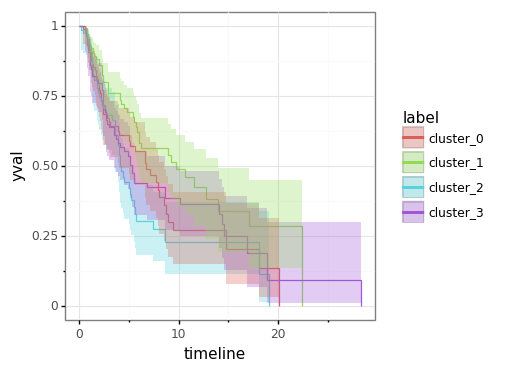

<ggplot: (-9223363254164239570)> 

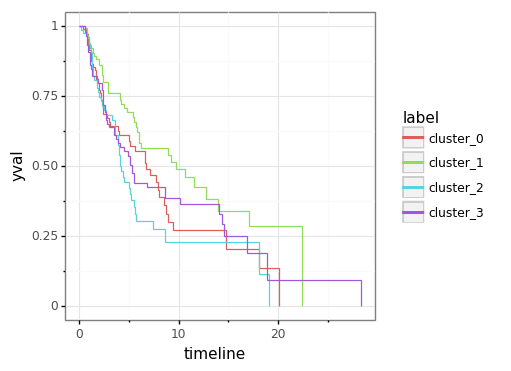

<ggplot: (-9223363254164257322)>


In [7]:
# ingest CIBERSORT table
ref_metric = 'OS'
subtypes = list(target_dict.values())
ciber_df['bcr_patient_barcode'] = ['-'.join(x.split('-')[:3]) for x in ciber_df['submitter_id']]

### gene clustering
n_clust = 4
timeline_threshold = 1000
dev_order_subset = subtypes
scale_data = False
input_table = pd.merge(ciber_df.loc[:,['bcr_patient_barcode','submitter_id']+subtypes],
                         tcga_meta_ordered.loc[:,['bcr_patient_barcode',
                                                  ref_metric,f'{ref_metric}.time',
                                                  'site','stage_code']],
                         'inner',
                         'bcr_patient_barcode')

data = input_table.loc[:,dev_order_subset].values
cluster_samples = input_table['submitter_id'].tolist()
    
# clustering
Z = hierarchy.linkage(data, 'ward', optimal_ordering=True)
cutree = hierarchy.cut_tree(Z, n_clusters=[n_clust])
labels = cutree.flatten().tolist()
dn = hierarchy.dendrogram(Z, 
                          labels=cluster_samples
                         )
labels = [f'cluster_{x}' for x in labels]
input_table['label'] = labels
index_order = dn['ivl']

### melt
static_features = ['bcr_patient_barcode','submitter_id',
                  ref_metric,f'{ref_metric}.time',
                  'site','stage_code','label']
mel_meta_merge_melt = pd.melt(input_table.loc[:, static_features+dev_order_subset], id_vars = static_features)
mel_meta_merge_melt['submitter_id'] = (mel_meta_merge_melt['submitter_id']
                                  .astype(str)
                                  .astype(CategoricalDtype(index_order, ordered = True))
                                 )
mel_meta_merge_melt['variable'] = (mel_meta_merge_melt['variable']
                               .astype(str)
                               .astype(CategoricalDtype(dev_order_subset, ordered=True))
                              )
mel_meta_merge_melt = mel_meta_merge_melt[[x is not np.nan for x in mel_meta_merge_melt.variable]]
mel_meta_merge_melt = mel_meta_merge_melt.dropna()

plotnine.options.figure_size = (4,4)
plot = (ggplot(mel_meta_merge_melt)
        + theme_bw()
        + theme(axis_text_x = element_text(angle = 90),
                axis_text_y = element_blank()
               )
        + geom_tile(aes('variable','submitter_id',fill='value'))
        + scale_alpha_continuous(guide=False)
        + scale_fill_cmap(heatmap_cmap)
       )
print(plot)

plotnine.options.figure_size = (4,4)
feature_val = ['factor(stage_code)','site','label']
for x in feature_val:
    plot = (ggplot(mel_meta_merge_melt)
            + theme_bw()
            + theme(axis_text_x = element_text(angle = 90),
                    axis_text_y = element_blank()
                   )
            + geom_tile(aes('variable','submitter_id',fill=x))
           )
    print(plot)
    
### KM analysis
    
# metrics
metric_label = ref_metric
metric = f'{metric_label}.time'

stage_corr = input_table.dropna()
stage_corr[metric_label] = stage_corr[metric_label].astype(int)
stage_corr[metric] = stage_corr[metric]/365
stage_corr = stage_corr[stage_corr[metric] < timeline_threshold]

## create a kmf object
kmf = KaplanMeierFitter() 

## Fit the data into the model
kmf_df = pd.DataFrame()
kmf_ribbon = pd.DataFrame()
for x in set(stage_corr['label']):
    print(x)
    durations = stage_corr[stage_corr['label'] == x][metric].tolist()
    event_observed = stage_corr[stage_corr['label'] == x][metric_label].tolist()
    kmf.fit(durations, event_observed,label = 'yval')
    kmf_slice = pd.merge(kmf.survival_function_.reset_index(),
                  kmf.confidence_interval_.reset_index().rename(columns = {'index':'timeline'}),
                  'inner',
                  'timeline')
    kmf_slice['label'] = x
    if kmf_slice.iloc[-1,:]['yval'] != 0:
        slice_update = kmf_slice.iloc[-1,:]
        kmf_slice = kmf_slice.iloc[:-1, :]
        slice_update['yval'] = 0
        slice_update['yval_upper_0.95'] = 0
        slice_update['yval_lower_0.95'] = 0
        kmf_slice = kmf_slice.append(slice_update)
    kmf_df = kmf_df.append(kmf_slice)
    kmf_ribbon = kmf_df.append(kmf_slice[:-1])


plot1 = (ggplot(kmf_df)
        + theme_bw()
        + geom_step(aes('timeline','yval',group='label',color='label'))
        + geom_rect(rect_converter(kmf_df, 'timeline', 'yval', 'yval_upper_0.95', 'yval_lower_0.95','label'),
                    aes(xmin='xmin', xmax='xmax', ymin='ymin', ymax='ymax', fill='label'), alpha=0.3)
       ) 
plot2 = (ggplot(kmf_df)
        + theme_bw()
        + geom_step(aes('timeline','yval',group='label',color='label'))
       )    

print(plot1, plot2)


...


/home/ubuntu/py_36_env/lib/python3.6/site-packages/plotnine/scales/scale.py:91: PlotnineWarning: scale_color_manual could not recognise parameter `guides`
  warn(msg.format(self.__class__.__name__, k), PlotnineWarning)


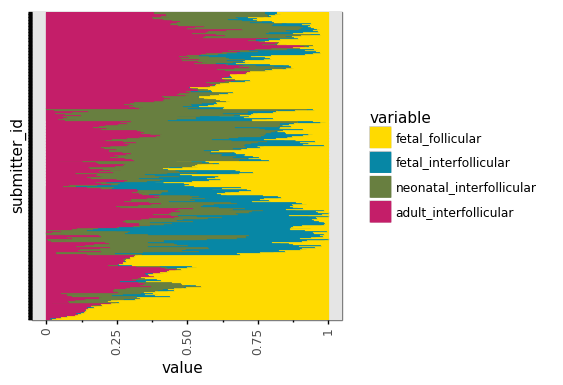

<ggplot: (-9223363254159154951)>


In [8]:
print('...')
rachel_color = {        
'fetal_follicular':'#FFDA00',   
'neonatal_interfollicular':'#687F40', 
'adult_interfollicular':'#C41E69',
'fetal_interfollicular':'#0787A5',
}
plotnine.options.figure_size = (4,4)
plot = (ggplot(mel_meta_merge_melt)
        + theme_bw()
        + theme(axis_text_y = element_blank(),
                axis_text_x = element_text(angle = 90),
               )
        + geom_bar(aes('submitter_id','value',
                       fill='variable',
                       color='variable'), stat='identity')
#         + scale_fill_manual(values=color_code_dict)
#         + scale_color_manual(values=color_code_dict, guides=False)
        + scale_fill_manual(values=rachel_color)
        + scale_color_manual(values=rachel_color, guides=False)        
        + coord_flip()
       )
print(plot)
# ggsave(plot, '/home/ubuntu/data/test/tcga_heatmap.pdf')


...


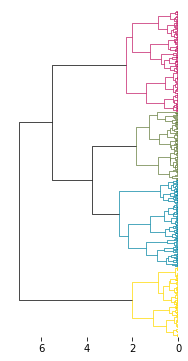

In [9]:
print('...')
mp.rcParams['lines.linewidth'] = 0.7

# hierarchy.set_link_color_palette([
#         '#39ff14',
#         '#ffda14',
#         '#ff1439', 
#         '#1439ff'])
hierarchy.set_link_color_palette([  
        '#FFDA00',   
     '#0787A5',
            '#687F40', 
        '#C41E69',
               
])

fig = plt.figure()
ax = plt.subplot(111)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)
# ax.axis('off')
fig.set_size_inches(3,6)
dn = hierarchy.dendrogram(Z, 
                          no_labels=True,
                          color_threshold=3,
                          orientation='left',
                          above_threshold_color='#000000',
                         )
# fig.savefig('/home/ubuntu/data/test/dendrogram.pdf')


...


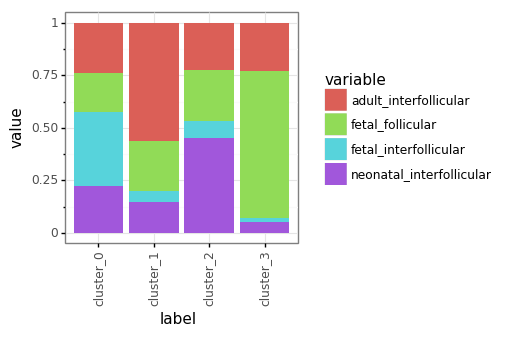

<ggplot: (8782691384433)>


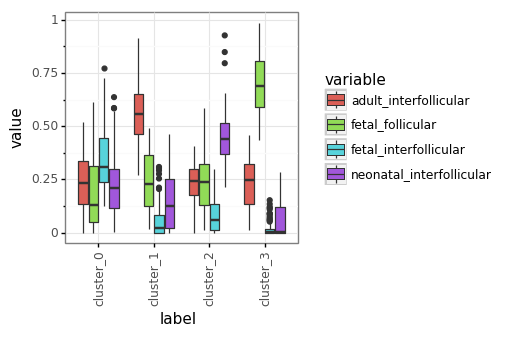

<ggplot: (8782690419818)>


In [10]:
print('...')
plot_df = (input_table
           .loc[:, ['label']+dev_order_subset]
           .groupby('label')
           .mean()
           .reset_index()
          )
plot_df = pd.melt(plot_df, id_vars = 'label')
# cluster_order = (plot_df[plot_df['variable'] == 'adult_interfollicular']
#                  .sort_values('value',ascending=False)['label']
#                  .tolist()
#                 )
# plot_df['label'] = (plot_df['label']
#                     .astype(str)
#                     .astype(CategoricalDtype(cluster_order, ordered=True))
#                    )
plotnine.options.figure_size = (3,3)
plot = (ggplot(plot_df)
        + theme_bw()
        + theme(axis_text_x = element_text(angle=90))
        + geom_bar(aes('label','value',fill='variable'), stat='identity')
       )
print(plot)

plot_df = input_table.loc[:, ['label']+dev_order_subset]
plot_df = pd.melt(plot_df, id_vars = 'label')
# plot_df['label'] = (plot_df['label']
#                     .astype(str)
#                     .astype(CategoricalDtype(cluster_order, ordered=True))
#                    )

# plot_df.sort_values(['variable','label'])

plot = (ggplot(plot_df)
        + theme_bw()
        + theme(axis_text_x = element_text(angle=90))
        + geom_boxplot(aes('label','value',fill='variable'))
       )
print(plot)


In [11]:
# assign names to clusters
cluster_dict = {'cluster_2':'neonatal_interfollicular',
                'cluster_1':'adult_interfollicular',
                'cluster_3':'fetal_follicular',
                'cluster_0':'fetal_interfollicular',
               }
input_table['label'] = [cluster_dict.get(x) for x in input_table['label']]
stage_corr['label'] = [cluster_dict.get(x) for x in stage_corr['label']]

In [12]:
metric = 'OS.time'
metric_label = 'OS'

log_ranks_df = pd.DataFrame()
for test in [(['neonatal_interfollicular'],['adult_interfollicular']),
             (['fetal_follicular'],['adult_interfollicular']),
             (['fetal_interfollicular'],['adult_interfollicular']),
             
             (['neonatal_interfollicular'],['fetal_follicular']),
             (['fetal_follicular'],['fetal_interfollicular']),
             (['fetal_interfollicular'],['neonatal_interfollicular']),
             
             (['adult_interfollicular','fetal_follicular','fetal_interfollicular'],['neonatal_interfollicular']),
             (['neonatal_interfollicular','fetal_follicular','fetal_interfollicular'],['adult_interfollicular']),
             (['neonatal_interfollicular','adult_interfollicular','fetal_interfollicular'],['fetal_follicular']),
             (['neonatal_interfollicular','adult_interfollicular','fetal_follicular'],['fetal_interfollicular']),
            ]:

    L1 = test[0]
    L2 = test[1]

    T1 = stage_corr[[x in L1 for x in stage_corr['label']]][metric].tolist()
    E1 = stage_corr[[x in L1 for x in stage_corr['label']]][metric_label].tolist()

    T2 = stage_corr[[x in L2 for x in stage_corr['label']]][metric].tolist()
    E2 = stage_corr[[x in L2 for x in stage_corr['label']]][metric_label].tolist()

    results = logrank_test(T1, T2, event_observed_A=E1, event_observed_B=E2)
    label_df = pd.DataFrame({'pval':[results.p_value],
                             'ref1':['.'.join(L1)],
                             'ref2':['.'.join(L2)]
                            })
    log_ranks_df = log_ranks_df.append(label_df)
log_ranks_df


,pval,ref1,ref2
0,0.000872,neonatal_interfollicular,adult_interfollicular
0,0.054307,fetal_follicular,adult_interfollicular
0,0.041298,fetal_interfollicular,adult_interfollicular
0,0.290379,neonatal_interfollicular,fetal_follicular
0,0.991251,fetal_follicular,fetal_interfollicular
0,0.189071,fetal_interfollicular,neonatal_interfollicular
0,0.016598,adult_interfollicular.fetal_follicular.fetal_i...,neonatal_interfollicular
0,0.005088,neonatal_interfollicular.fetal_follicular.feta...,adult_interfollicular
0,0.666187,neonatal_interfollicular.adult_interfollicular...,fetal_follicular
0,0.599116,neonatal_interfollicular.adult_interfollicular...,fetal_interfollicular


...
neonatal_interfollicular
4.175342465753425
6.767123287671233


/home/ubuntu/py_36_env/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
/home/ubuntu/py_36_env/lib/python3.6/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


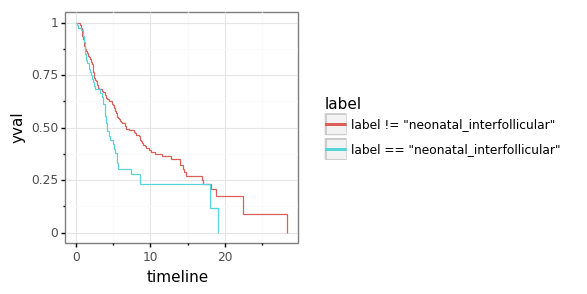

<ggplot: (-9223363254163512260)>
adult_interfollicular
9.764383561643836
5.126027397260274


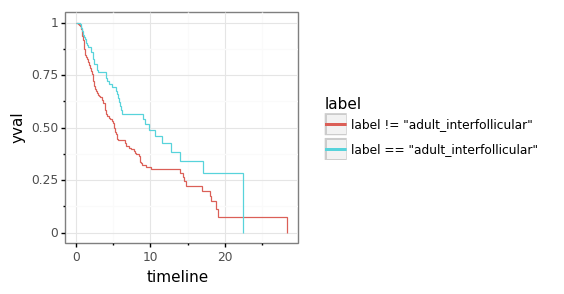

<ggplot: (-9223363254162560964)>
fetal_follicular
5.252054794520548
6.005479452054795


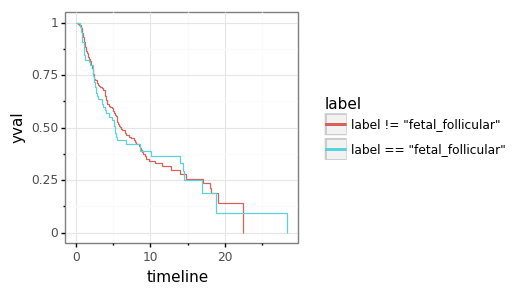

<ggplot: (-9223363254162645181)>
fetal_interfollicular
6.723287671232876
5.53972602739726


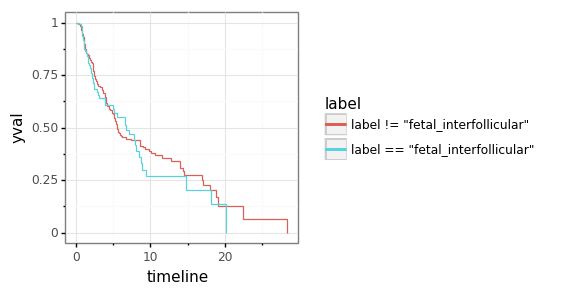

<ggplot: (8782692134187)>


In [13]:
print('...')
# serial KM prints: target vs rest

# metrics
metric_label = ref_metric
metric = f'{metric_label}.time'

stage_corr = input_table.dropna()
stage_corr[metric_label] = stage_corr[metric_label].astype(int)
stage_corr[metric] = stage_corr[metric]/365

targets = list(cluster_dict.values())
for target in targets:
    print (target)
    ## create a kmf object
    kmf = KaplanMeierFitter() 
    kmf_df = pd.DataFrame()
    kmf_ribbon = pd.DataFrame()
    qs = [f'label == "{target}"', f'label != "{target}"']
    for q in qs:
        durations = stage_corr.query(q)[metric].tolist()
        event_observed = stage_corr.query(q)[metric_label].tolist()
        kmf.fit(durations, event_observed,label = 'yval')
        print(kmf.median_survival_time_)
        kmf_slice = pd.merge(kmf.survival_function_.reset_index(),
                      kmf.confidence_interval_.reset_index().rename(columns = {'index':'timeline'}),
                      'inner',
                      'timeline')
        kmf_slice['label'] = q
        if kmf_slice.iloc[-1,:]['yval'] != 0:
            slice_update = kmf_slice.iloc[-1,:]
            kmf_slice = kmf_slice.iloc[:-1, :]
            slice_update['yval'] = 0
            slice_update['yval_upper_0.95'] = 0
            slice_update['yval_lower_0.95'] = 0
            kmf_slice = kmf_slice.append(slice_update)
        kmf_df = kmf_df.append(kmf_slice)
        kmf_ribbon = kmf_df.append(kmf_slice[:-1])

    # apply filters
    kmf_df = kmf_df[kmf_df['timeline'] < timeline_threshold]

    plotnine.options.figure_size=(3,3)
    plot1 = (ggplot(kmf_df)
            + theme_bw()
            + geom_step(aes('timeline','yval',group='label',color='label'))
            + geom_rect(rect_converter(kmf_df, 'timeline', 'yval', 'yval_upper_0.95', 'yval_lower_0.95','label'),
                        aes(xmin='xmin', xmax='xmax', ymin='ymin', ymax='ymax', fill='label'), alpha=0.3)
           ) 
    plot2 = (ggplot(kmf_df)
            + theme_bw()
            + geom_step(aes('timeline','yval',group='label',color='label'))
           )   

    print(plot2)


## TCGA cluster gene signatures

In [24]:
# cross-reference drug bank
drug_df = pd.read_csv(f'{wkdir}/pharmacologically_active.csv')
# filter on human
drug_df = drug_df[drug_df.Species == 'Humans']
drug_df = drug_df.loc[:,['Name','Gene Name', 'Drug IDs']]
drug_df = drug_df.rename(columns = {'Name':'desc',
                          'Gene Name':'gene',
                          'Drug IDs':'drug_id'
                         })
drug_df = drug_df.dropna()
drug_genes = list(set(drug_df['gene']))

channel_list = []
for x in drug_df.gene:
    drug_slice = drug_df[drug_df.gene == x]
    drug_desc = drug_slice.desc.tolist()[0].split(' ')
    if 'channel' in drug_desc:
        channel_list = channel_list+[x]

# ref = doi: 10.1093/database/bav067
epifactors_df = pd.read_csv(f'{wkdir}/EpiGenes_main.csv', index_col = 0)
epifactors_genes = epifactors_df.HGNC_symbol.tolist()


# transform tcga df

# pd df to np array
input_matrix = (tcga_df_fltr
                .set_index('submitter_id')
                .drop('bcr_patient_barcode', axis=1)
                .T
                .loc[:,input_table.submitter_id.tolist()]
               )
array_adata = input_matrix.values

# extract obs and var
obs = input_matrix.columns.tolist()
gene_names = input_matrix.index.tolist()

# create ad obj
tcga_adata = ad.AnnData(X=array_adata).T
tcga_adata.X = sparse.csr_matrix(tcga_adata.X)
tcga_adata.var_names = gene_names
tcga_adata.obs_names = obs

# append metadata
tcga_adata.obs['cluster'] = input_table.label.tolist()


### volcano: target vs rest

... storing 'cluster' as categorical
... storing 'grouped_cluster' as categorical
/home/ubuntu/py_36_env/lib/python3.6/site-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 2347 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


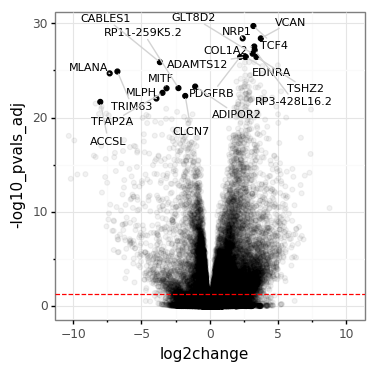

In [25]:
#cluster DE
input_adata = tcga_adata
target = 'fetal_follicular'
input_adata.obs['grouped_cluster'] = ['rest' if x != target \
                                      else x \
                                      for x in input_adata.obs['cluster']]
results_df = adata_DE_pairwise(input_adata, 
                              'grouped_cluster', 
                              target, 
                              'rest', 
                             )
results_df = results_df.dropna()
# transform
results_df['-log10_pvals_adj'] = [-np.log10(x) for x in results_df['pvals_adj']]
# replace inf with machine precision
results_df = results_df.replace(np.inf, np.nan)
results_df = results_df.replace(np.nan, np.nanmax(results_df['-log10_pvals_adj'].values))
# append top DE genes
neg_geneset = (results_df[results_df['log2change'] < 0]
               .sort_values('-log10_pvals_adj', ascending=False)
               .gene.tolist()
              )
pos_geneset = (results_df[results_df['log2change'] > 0]
               .sort_values('-log10_pvals_adj', ascending=False)
               .gene.tolist()
              )
# add multitest cutoff
alpha = 0.05
threshold = -np.log10(alpha)

# plot variables
gene_n = 10
results_df['GOI'] = [x in pos_geneset[:gene_n]+neg_geneset[:gene_n] for x in results_df.gene]

# determine xlim
xlim_df = results_df.sort_values(['-log10_pvals_adj'], ascending = False)
xlim_df['rank'] = xlim_df['-log10_pvals_adj'].rank(pct = True)
xlim_val = xlim_df[xlim_df['rank'] > 0.95]['log2change'].abs().max()

plotnine.options.figure_size = (4,4)
plot = (ggplot(results_df)
        + theme_bw()
        + theme(legend_position = 'none')
        + geom_point(aes('log2change','-log10_pvals_adj'), alpha = 0.05)
        + geom_text(results_df[results_df['GOI']==True], 
                    aes('log2change','-log10_pvals_adj',label='gene'),
                   size = 8)
        + geom_point(results_df[results_df['GOI']==True], aes('log2change','-log10_pvals_adj'))
        + geom_hline(aes(yintercept = threshold), linetype = '--', color = 'red')
#         + scale_color_manual(values = color_code_dict)
        + scale_x_continuous(limits=(-xlim_val,
                                     xlim_val))
       )
f = plot.draw()
for a in f.axes:
    texts = [t for t in  a.texts]
    adjust_text(texts,ax=a, arrowprops=dict(arrowstyle='-', color='#D3D3D3'),
                force_text=(0.1, 1),
#                 force_points=(1, 1),
                expand_text=(1.3, 1.3),
#                 expand_points=(2, 2)
               )



### geneset volcanos

Ellipsis
immune_infiltrating
[[86, 99], [8615, 4706]] 0.9999998171547084


/home/ubuntu/py_36_env/lib/python3.6/site-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 2347 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


immune_resistent
[[20, 105], [8681, 4700]] 1.0


/home/ubuntu/py_36_env/lib/python3.6/site-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 2347 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


FDA_drug
[[359, 101], [8342, 4704]] 8.60655238518035e-11


/home/ubuntu/py_36_env/lib/python3.6/site-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 2347 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


channels
[[49, 4], [8652, 4801]] 2.312165601459647e-06


/home/ubuntu/py_36_env/lib/python3.6/site-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 2347 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


epifactors
[[167, 111], [8534, 4694]] 0.9436882590287592


/home/ubuntu/py_36_env/lib/python3.6/site-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 2347 rows containing missing values.
  self.data = self.geom.handle_na(self.data)
/home/ubuntu/py_36_env/lib/python3.6/site-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 2 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


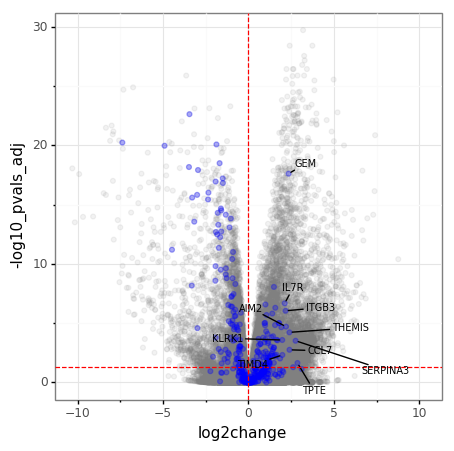

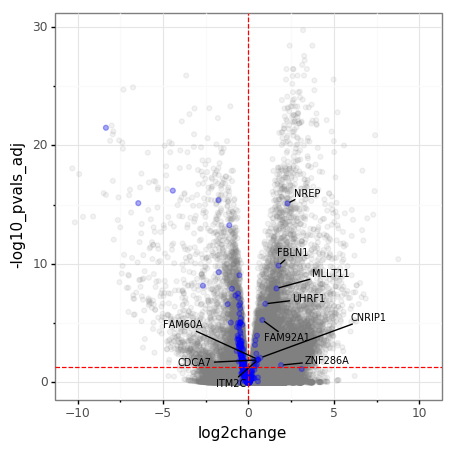

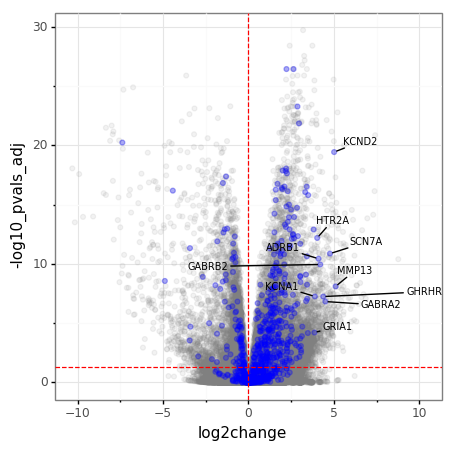

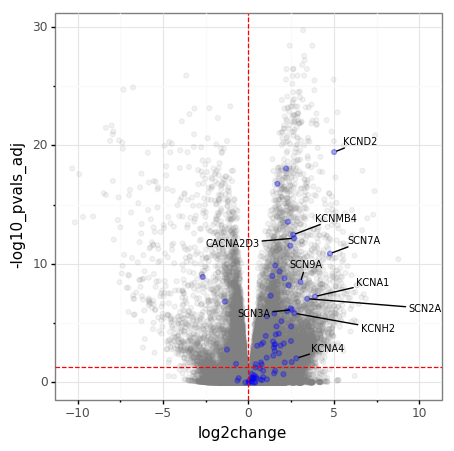

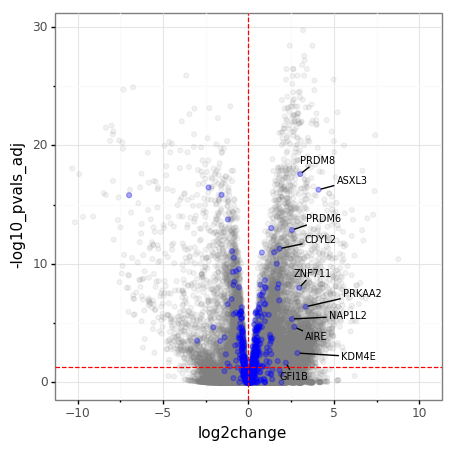

In [30]:
print(...)
## immune geneset
# ref = https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4580370/#SD2
immune_infil = list(set(pd.read_csv(f'{wkdir}/immune_set.csv', header=None)[0])&set(full_adata.var_names))

## aviv's immune resistence geneset
# ref = 10.1016/j.cell.2018.09.006
immune_genes = pd.read_csv(f'{wkdir}/aviv_up_immune.csv', header=0).upregulated.tolist()
immune_resist = list(set(immune_genes)&set(full_adata.var_names))

immune_genes = pd.read_csv(f'{wkdir}/aviv_down_immune.csv', header=0).downregulated.tolist()
immune_infil = list(set(immune_infil + list(set(immune_genes)&set(full_adata.var_names))))

geneset_dict = {'immune_infiltrating':[immune_infil, False],
                'immune_resistent':[immune_resist, False],
                'FDA_drug':[drug_genes, False],
                'channels':[channel_list, False],
                'epifactors':[epifactors_genes, False],
               }

for key,value in geneset_dict.items():
    print(key)
    immune_genes = value[0]
    sort_val = value[1]
    
    # Fisher exact test
    # contingency table [immune_yes, immune_no] x [right-enriched, left-enriched]
    # immune_yes, right-enriched
    elem_1 = len(results_df[[x in immune_genes for x in results_df.gene]]
                 .query('pvals_adj < 0.05')
                 .query('log2change > 0')
                )
    # immune_yes, left-enriched
    elem_2 = len(results_df[[x in immune_genes for x in results_df.gene]]
                 .query('pvals_adj < 0.05')
                 .query('log2change < 0')
                )
    # immune_no, right-enriched             
    elem_3 = len(results_df[[x not in immune_genes for x in results_df.gene]]
                 .query('pvals_adj < 0.05')
                 .query('log2change > 0')
                )
    # immune_no, left-enriched             
    elem_4 = len(results_df[[x not in immune_genes for x in results_df.gene]]
                 .query('pvals_adj < 0.05')
                 .query('log2change < 0')
                )

    cont_table = [[elem_1, elem_2], [elem_3, elem_4]]
    oddsratio, pvalue = scipy.stats.fisher_exact(cont_table, 'greater')
    print(cont_table, pvalue)
    
    # volcano plot
    print_genes_df = (results_df[[x in immune_genes for x in results_df.gene]]
                         .query('pvals_adj < 0.05')
                         .dropna()
                         .sort_values('log2change', ascending=sort_val)
                         .head(10)
                        )
    
    # determine xlim
    xlim_df = results_df.sort_values(['-log10_pvals_adj'], ascending = False)
    xlim_df['rank'] = xlim_df['-log10_pvals_adj'].rank(pct = True)
    xlim_val = xlim_df[xlim_df['rank'] > 0.95]['log2change'].abs().max()
    
    plotnine.options.figure_size=(5,5)
    plot = (ggplot(results_df)
            + theme_bw()
            + theme(aspect_ratio=1)
            + geom_point(aes('log2change','-log10_pvals_adj'),color='grey', alpha=0.1)
            + geom_point(results_df[[x in immune_genes for x in results_df.gene]],
                         aes('log2change','-log10_pvals_adj'),color='blue', alpha = 0.3)
            + geom_vline(aes(xintercept=0), color = 'red', linetype='--')
            + geom_hline(aes(yintercept=-np.log10(0.05)), color = 'red', linetype='--')
            + geom_text(print_genes_df,
                        aes('log2change','-log10_pvals_adj',label='gene'), size=7
                       )
            + scale_x_continuous(limits=(-xlim_val,
                         xlim_val))
           )

    f = plot.draw()
    for a in f.axes:
        texts = [t for t in  a.texts]
        adjust_text(texts,ax=a, arrowprops=dict(arrowstyle='-', color='black'),
                    force_text=(0.1, 0.6),
                    force_points=(0.5, 1),
                    expand_text=(2, 2),
                    expand_points=(2, 2)
                   )
    

In [31]:
# supp table 8


# compile_dict = {'immune_infiltrating':immune_infil,
#                 'immune_resistent':immune_resist,
#                 'FDA_drug':drug_genes,
#                }
# df = pd.DataFrame()
# for key,value in compile_dict.items():
#     df_slice = pd.DataFrame({'gene':value})
#     df_slice['gene_list'] = key
#     df = df.append(df_slice)
# df['gene_list'] = ['FDA_drug (ion_channel)' if x in channel_list and y == 'FDA_drug' \
#                    else y
#                    for x,y in zip(df.gene, df.gene_list)]

# (df
#  .sort_values(['gene_list','gene'])
#  .to_csv(sys.stdout, index = False)
# )

Ellipsis


/home/ubuntu/py_36_env/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/home/ubuntu/py_36_env/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


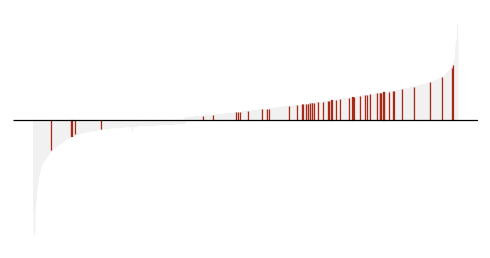

<ggplot: (-9223363254633517098)>


In [32]:
# channels waterfall plot
target_set = 'channels'
bar_df = results_df.query('pvals_adj < 0.05')
bar_df[target_set] = [x in geneset_dict.get(target_set)[0] for x in bar_df.gene]
bar_df['rank_val'] = bar_df['log2change'].rank(method='dense')

plotnine.options.figure_size = (6,3)
plot = (ggplot(bar_df)
        + theme_bw()
        + theme(aspect_ratio = 1/2,
                panel_grid_major = element_blank(), 
                panel_grid_minor = element_blank(),
                axis_text_x = element_blank(),
                axis_text_y = element_blank(),
                panel_border = element_blank(),
                axis_ticks = element_blank(),
                legend_position = 'none'
               )
        + geom_bar(aes('rank_val','log2change',
                       fill=target_set,
                       color=target_set
                      ),
                   stat='identity'
                  )
        + geom_bar(bar_df[bar_df[target_set] == True], aes('rank_val','log2change',
                       fill=target_set,
                       color=target_set
                      ),
                   stat='identity'
                  )
        + geom_hline(aes(yintercept=0))
        + scale_fill_manual(values={True:'#a62a17',
                                    False:'#f1f1f1'
                                   })
        + scale_color_manual(values={True:'#a62a17',
                                    False:'#f1f1f1'
                                   })
        + labs(x='',y='')
       )
print(plot)


# 1D heatmaps for clusters

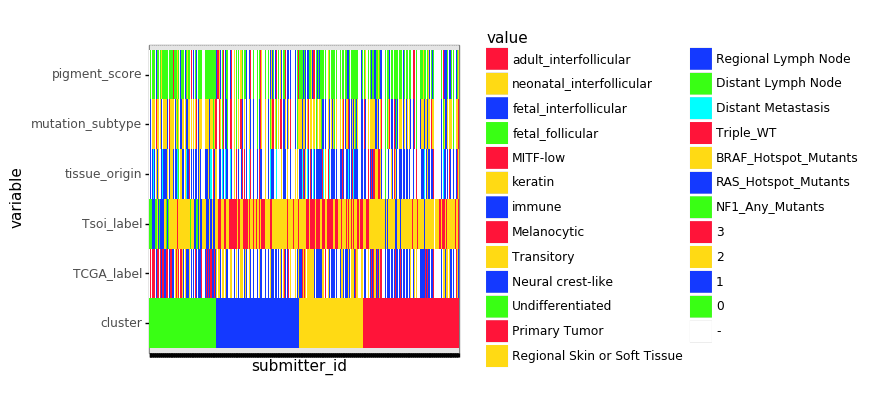

<ggplot: (8782233525396)>

In [72]:
# master genelists
lit_gl_df = pd.read_csv(f'{wkdir}/DL20200131_lit_genelists.csv', 
                        header = 0, 
                        index_col=0, 
                        dtype=str)
tiroshAXL = lit_gl_df['tiroshAXL'].dropna().tolist()
tiroshMITF = lit_gl_df['tiroshMITF'].dropna().tolist()
Hoek2012_Invasive = lit_gl_df['Hoek2012_Invasive'].dropna().tolist()
Hoek2012_Proliferative = lit_gl_df['Hoek2012_Proliferative'].dropna().tolist()

# TCGA metrics
tcga_muts = (pd.read_csv('s3://darmanis-group/danle/MEL_project/tcga_mut_analysis.csv', sep=',', header=1)
             .rename(columns={'Name':'submitter_id'})
            )
tcga_muts['submitter_id'] = [f'{x}A' for x in tcga_muts['submitter_id']]
features = ['submitter_id','PIGMENT.SCORE', 'CURATED_TCGA_SPECIMEN_Distant','MUTATIONSUBTYPES','RNASEQ-CLUSTER_CONSENHIER']
tcga_muts = (tcga_muts
             .loc[:,features]
             .replace('-', np.nan)
            )

# Tsoi 
tsoi_df = pd.read_csv(f'{wkdir}/Tsoi_TCGAdifferntiationLabels.csv',
                      header = 1
                     )
tsoi_df = (tsoi_df.loc[:,['Sample','Subtype']]
           .rename(columns = {'Sample':'submitter_id',
                              'Subtype':'label'
                             })
          )
tsoi_df.sort_values('submitter_id')

# AXL+MITF
tcga_input = (tcga_df_fltr
                .set_index('submitter_id')
                .drop('bcr_patient_barcode', axis=1)
                .loc[input_table.submitter_id.tolist(),:]
                .rank(pct=True, method='dense',axis=1)
                )
tcga_axl_mitf = (pd.DataFrame(tcga_input.loc[:, list(set(tcga_input.columns)&set(tiroshAXL))].mean(axis=1) /\
                              tcga_input.loc[:, list(set(tcga_input.columns)&set(tiroshMITF))].mean(axis=1))
                 .reset_index()
                 .rename(columns={0:'axl_mitf',
                                  'index':'submitter_id'
                                 })
                )
tcga_axl_mitf['axl'] = tcga_input.loc[:, list(set(tcga_input.columns)&set(tiroshAXL))].mean(axis=1).tolist()
tcga_axl_mitf['axl_zscore'] = stats.zscore(tcga_axl_mitf['axl'])
tcga_axl_mitf['mitf'] = tcga_input.loc[:, list(set(tcga_input.columns)&set(tiroshMITF))].mean(axis=1).tolist()
tcga_axl_mitf['mitf_zscore'] = stats.zscore(tcga_axl_mitf['mitf'])
tcga_axl_mitf['axl_mitf_zscore'] = stats.zscore(tcga_axl_mitf['axl_mitf'])
tcga_axl_mitf = tcga_axl_mitf.drop('axl_mitf', axis=1)

# invasion+proliferation 
tcga_inv_pro = (pd.DataFrame(tcga_input.loc[:, list(set(tcga_input.columns)&set(Hoek2012_Invasive))].mean(axis=1) /\
                             tcga_input.loc[:, list(set(tcga_input.columns)&set(Hoek2012_Proliferative))].mean(axis=1))
                 .reset_index()
                 .rename(columns={0:'inv_pro',
                                  'index':'submitter_id'
                                 })
                 .sort_values('inv_pro')
                )
tcga_inv_pro['inv'] = tcga_input.loc[:, list(set(tcga_input.columns)&set(Hoek2012_Invasive))].mean(axis=1).tolist()
tcga_inv_pro['inv_zscore'] = stats.zscore(tcga_inv_pro['inv'])
tcga_inv_pro['pro'] = tcga_input.loc[:, list(set(tcga_input.columns)&set(Hoek2012_Proliferative))].mean(axis=1).tolist()
tcga_inv_pro['pro_zscore'] = stats.zscore(tcga_inv_pro['pro'])
tcga_inv_pro['inv_pro_zscore'] = stats.zscore(tcga_inv_pro['inv_pro'])
tcga_inv_pro = tcga_inv_pro.drop('inv_pro', axis=1)

# ingest cibersort results
cluster_df = input_table.loc[:,['submitter_id','label']].rename(columns={'label':'cluster'})

# merge all dfs
heatmap_tracks = pd.merge(cluster_df,
                          tcga_muts,
                          'left',
                          'submitter_id'
                         )
heatmap_tracks = pd.merge(heatmap_tracks,
                          tsoi_df,
                          'outer',
                          'submitter_id'
                         )
heatmap_tracks = pd.merge(heatmap_tracks,
                          tcga_axl_mitf,
                          'outer',
                          'submitter_id'
                         )
heatmap_tracks = pd.merge(heatmap_tracks,
                          tcga_inv_pro,
                          'outer',
                          'submitter_id'
                         )

heatmap_tracks = heatmap_tracks.rename(columns = {'PIGMENT.SCORE':'pigment_score',
                                                  'CURATED_TCGA_SPECIMEN_Distant':'tissue_origin',
                                                  'MUTATIONSUBTYPES':'mutation_subtype',
                                                  'RNASEQ-CLUSTER_CONSENHIER':'TCGA_label',
                                                  'label':'Tsoi_label',
                                                 })
heatmap_tracks = heatmap_tracks.replace(np.nan, '-')

heatmap_tracks_cats = heatmap_tracks.loc[:,['submitter_id',
                                            'tissue_origin',
                                            'pigment_score',
                                            'mutation_subtype',
                                            'TCGA_label',
                                            'Tsoi_label',
                                            'cluster'
                                           ]]


heatmap_tracks_nums = heatmap_tracks.loc[:,['submitter_id',
                                            'axl_mitf_zscore','axl_zscore','mitf_zscore',
                                            'inv_pro_zscore','inv_zscore','pro_zscore',
#                                             'axl','mitf','inv','pro',
                                           ]]
heatmap_tracks_nums['submitter_id'] = (heatmap_tracks_nums['submitter_id']
                                  .astype(str)
                                  .astype(CategoricalDtype(index_order, ordered = True))
                                 )


fill_dict = {
             # present labels
             'adult_interfollicular':'#ff1439',
             'neonatal_interfollicular':'#ffda14',
             'fetal_interfollicular':'#1439ff',
             'fetal_follicular':'#39ff14',
    
             # tcga labels
             'MITF-low':'#ff1439',
             'keratin':'#ffda14',
             'immune':'#1439ff',
    
             # Tsoi labels
             'Melanocytic':'#ff1439',
             'Transitory':'#ffda14',
             'Neural crest-like':'#1439ff',
             'Undifferentiated':'#39ff14',
    
             # tcga regions
             'Primary Tumor':'#ff1439',
             'Regional Skin or Soft Tissue':'#ffda14',
             'Regional Lymph Node':'#1439ff',
             'Distant Lymph Node':'#39ff14',
             'Distant Metastasis':'#00ffff',
    
             # tcga mutations
             'Triple_WT':'#ff1439',
             'BRAF_Hotspot_Mutants':'#ffda14',
             'RAS_Hotspot_Mutants':'#1439ff',
             'NF1_Any_Mutants':'#39ff14',
            
             # tcga pigment level
             '3':'#ff1439',
             '2':'#ffda14',
             '1':'#1439ff',
             '0':'#39ff14',
             
             # empty
             '-':'#ffffff',
            }

plot_df = pd.melt(heatmap_tracks_cats, id_vars='submitter_id')
plot_df['submitter_id'] = (plot_df['submitter_id']
                                  .astype(str)
                                  .astype(CategoricalDtype(index_order, ordered=True))
                                 )
plot_df['value'] = (plot_df['value']
                    .astype(str)
                    .astype(CategoricalDtype(list(fill_dict.keys()), ordered=True))
                   )
plot_df['variable'] = (plot_df['variable']
                       .astype(str)
                       .astype(CategoricalDtype([
                                                'cluster',
                                                'TCGA_label',
                                                'Tsoi_label',
                                                'tissue_origin',
                                                'mutation_subtype',
                                                'pigment_score',
                                                ]))
                      )

plotnine.options.figure_size=(4,4)
plot = (ggplot(plot_df)
        + theme_bw()
        + theme(axis_text_x = element_blank())
        + geom_tile(aes('submitter_id', 'variable',fill='value'))
        + scale_fill_manual(values=fill_dict)
       )
plot

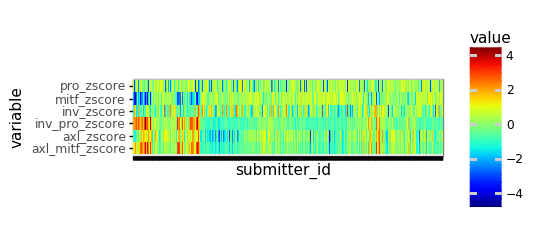

<ggplot: (-9223363254162383342)>

In [48]:
# program score tracks
plot_df = pd.melt(heatmap_tracks_nums, id_vars='submitter_id')
plot_df = plot_df.replace('-', np.nan)
plot_df['submitter_id'] = (plot_df['submitter_id']
                                  .astype(str)
                                  .astype(CategoricalDtype(index_order, ordered = True))
                                 )
plot_df['value'] = plot_df['value'].astype(float)
plot_df['variable'] = plot_df['variable'].astype('category')

plotnine.options.figure_size=(4,1)
plot = (ggplot(plot_df)
        + theme_bw()
        + theme(axis_text_x = element_blank())
        + geom_tile(aes('submitter_id', 'variable',fill='value'))
        + scale_fill_cmap('jet')
       )
plot

## Fisher test for enrichment of labels in categories

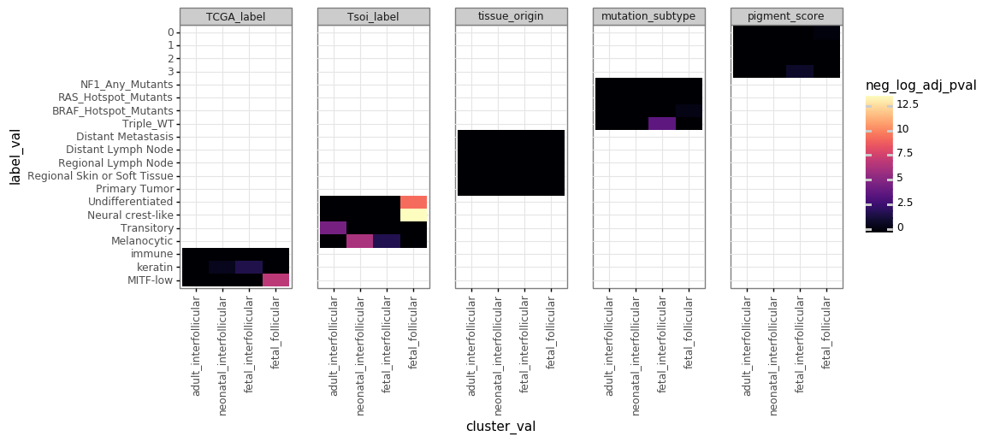

<ggplot: (-9223363254163874153)>

In [51]:
master_results = pd.DataFrame()
label_order = ['TCGA_label',
            'Tsoi_label',
            'tissue_origin',
            'mutation_subtype',
            'pigment_score',]
for label in label_order:
    label_slice = (heatmap_tracks
                   .loc[:,['cluster',label]]
                   .query(f'{label} != "-"')
                  )
    for label_val in set(label_slice[label]):
        label_slice['condition_label'] = label_slice[label] == label_val

        for cluster_val in set(label_slice['cluster']):
            label_slice['condition_cluster'] = label_slice['cluster'] == cluster_val
            # contingency table 
            #               |label_true | label_false
            # cluster_true  |    1      |      2
            # cluster_false |    3      |      4 
            elem_1 = len(label_slice[[x==True and y==True for x,y in zip(label_slice['condition_label'], label_slice['condition_cluster'])]])
            elem_2 = len(label_slice[[x==False and y==True for x,y in zip(label_slice['condition_label'], label_slice['condition_cluster'])]])
            elem_3 = len(label_slice[[x==True and y==False for x,y in zip(label_slice['condition_label'], label_slice['condition_cluster'])]])
            elem_4 = len(label_slice[[x==False and y==False for x,y in zip(label_slice['condition_label'], label_slice['condition_cluster'])]])

            cont_table = [[elem_1, elem_2], [elem_3, elem_4]]
            _, pvalue = scipy.stats.fisher_exact(cont_table, 'greater')

            results_slice = pd.DataFrame({'pval':[pvalue]})
            results_slice['label'] = label
            results_slice['label_val'] = label_val
            results_slice['cluster_val'] = cluster_val

            master_results = master_results.append(results_slice)

master_results['adj_pval'] = master_results['pval']*len(master_results)
master_results['adj_pval'] = [x if x <= 1 else 1 for x in master_results['adj_pval']] 
master_results['neg_log_adj_pval'] = -np.log10(master_results['adj_pval'])
master_results['label'] = (master_results['label']
                           .astype(str)
                           .astype(CategoricalDtype(label_order, ordered=True))
                          )
master_results['cluster_val'] = (master_results['cluster_val']
                           .astype(str)
                           .astype(CategoricalDtype(['adult_interfollicular',
                                                'neonatal_interfollicular',
                                                'fetal_interfollicular',
                                                'fetal_follicular'], ordered=True))
                          )
master_results['label_val'] = (master_results['label_val']
                            .astype(str)
                            .astype(CategoricalDtype(list(fill_dict.keys()), ordered=True))
                              )
plotnine.options.figure_size=(10,4)
plot = (ggplot(master_results)
        + theme_bw()
        + theme(axis_text_x = element_text(angle=90),
                panel_spacing_x = 0.3,
               )
        + geom_tile(aes('cluster_val', 'label_val', fill = 'neg_log_adj_pval'))
        + facet_wrap('~label', ncol=5)
        + scale_fill_cmap('magma')
       )
plot

### genelist program score heatmap

In [52]:
print(...)
input_adata = tcga_adata
for genelist_key in geneset_dict.keys():
    genelist = list(set(input_adata.var_names) & set(geneset_dict.get(genelist_key)[0]))
    input_adata.obs['sample'] = input_adata.obs.index.tolist()
    input_adata.obs['sample'] = (input_adata
                              .obs['sample']
                              .astype(str)
                              .astype(CategoricalDtype(input_adata.obs['sample'].tolist())))
    cat, exp_df = prepare_dataframe(input_adata,
                     var_names = input_adata.var_names.tolist(),
                     groupby = 'sample')
    exp_df = exp_df.rank(pct=True, axis=1, method = 'dense') # ranking per cell
    exp_df = exp_df.loc[:, genelist]
    input_adata.obs[genelist_key] = exp_df.loc[:,genelist].mean(axis=1)

Ellipsis


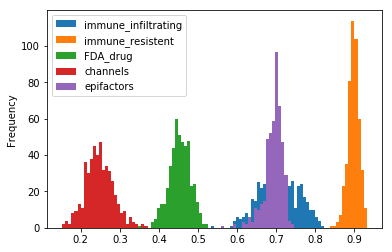

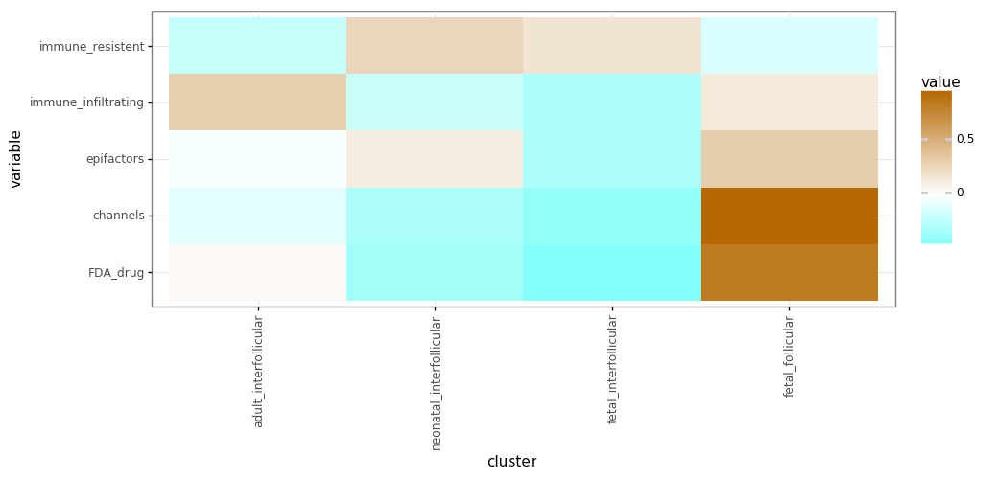

<ggplot: (-9223363254162507825)>


In [54]:
plot_df = input_adata.obs.loc[:,['cluster']+list(geneset_dict.keys())]
display(plot_df.plot.hist(bins=100))
for x in geneset_dict.keys():
    plot_df[x] = stats.zscore(plot_df[x])
plot_df = pd.melt(plot_df, id_vars=['cluster'])

plot_df = plot_df.groupby(['cluster','variable']).mean()
plot_df = plot_df.reset_index()
plot_df['cluster'] = (plot_df['cluster']
                            .astype(str)
                            .astype(CategoricalDtype(['adult_interfollicular',
                                                'neonatal_interfollicular',
                                                'fetal_interfollicular',
                                                'fetal_follicular'], 
                                               ordered=True)))

plot = (ggplot(plot_df)
        + theme_bw()
        + theme(axis_text_x = element_text(angle=90))
        + geom_tile(aes('cluster','variable',fill='value'))
        + scale_fill_gradient2(low='#02fff2',
                                mid='#ffffff',
                                high='#b56802',
                                midpoint=0,)
       )
print(plot)

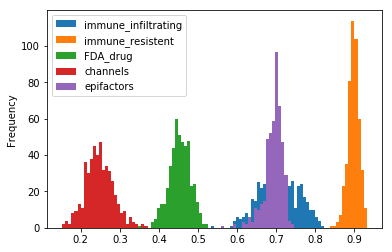

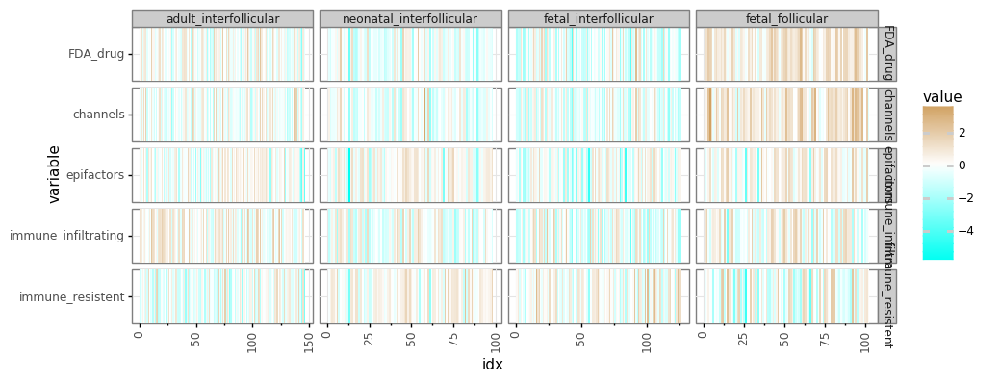

<ggplot: (8782690510712)>


In [57]:
# per sample heatmap

plot_df = input_adata.obs.loc[:,['cluster', 'immune_infiltrating', 'immune_resistent', 'FDA_drug', 'channels', 'epifactors']]
display(plot_df.plot.hist(bins=100))
for x in ['immune_infiltrating', 'immune_resistent', 'FDA_drug', 'channels', 'epifactors']:
    plot_df[x] = stats.zscore(plot_df[x])
plot_df = pd.melt(plot_df, id_vars=['cluster'])
plot_df['idx'] = plot_df.groupby(['cluster','variable']).cumcount()+1
plot_df['cluster'] = (plot_df['cluster']
                            .astype(str)
                            .astype(CategoricalDtype(['adult_interfollicular',
                                                'neonatal_interfollicular',
                                                'fetal_interfollicular',
                                                'fetal_follicular'], 
                                               ordered=True))
                           )

plot = (ggplot(plot_df)
        + theme_bw()
        + theme(axis_text_x = element_text(angle=90))
        + geom_tile(aes('idx','variable',fill='value'))
        + facet_grid('variable~cluster', scales = 'free')
        + scale_fill_gradient2(low='#02fff2',
                                mid='#ffffff',
                                high='#b56802',
                                midpoint=0,)
       )
print(plot)


### test difference between NEO and FET

/home/ubuntu/py_36_env/lib/python3.6/site-packages/plotnine/layer.py:452: PlotnineWarning: geom_point : Removed 2780 rows containing missing values.
  self.data = self.geom.handle_na(self.data)


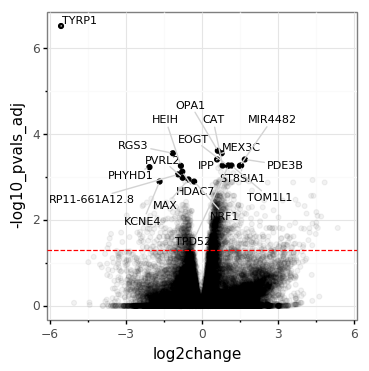

In [59]:
#cluster DE
input_adata = tcga_adata
results_df = adata_DE_pairwise(input_adata, 
                              'cluster', 
                              'neonatal_interfollicular', 
                              'fetal_interfollicular', 
                             )
results_df = results_df.dropna()
# transform
results_df['-log10_pvals_adj'] = [-np.log10(x) for x in results_df['pvals_adj']]
# replace inf with machine precision
results_df = results_df.replace(np.inf, np.nan)
results_df = results_df.replace(np.nan, np.nanmax(results_df['-log10_pvals_adj'].values))
# append top DE genes
neg_geneset = (results_df[results_df['log2change'] < 0]
               .sort_values('-log10_pvals_adj', ascending=False)
               .gene.tolist()
              )
pos_geneset = (results_df[results_df['log2change'] > 0]
               .sort_values('-log10_pvals_adj', ascending=False)
               .gene.tolist()
              )
# add multitest cutoff
alpha = 0.05
threshold = -np.log10(alpha)

# plot variables
gene_n = 10
results_df['GOI'] = [x in pos_geneset[:gene_n]+neg_geneset[:gene_n] for x in results_df.gene]

# determine xlim
xlim_df = results_df.sort_values(['-log10_pvals_adj'], ascending = False)
xlim_df['rank'] = xlim_df['-log10_pvals_adj'].rank(pct = True)
xlim_val = xlim_df[xlim_df['rank'] > 0.95]['log2change'].abs().max()

plotnine.options.figure_size = (4,4)
plot = (ggplot(results_df)
        + theme_bw()
        + theme(legend_position = 'none')
        + geom_point(aes('log2change','-log10_pvals_adj'), alpha = 0.05)
        + geom_text(results_df[results_df['GOI']==True], 
                    aes('log2change','-log10_pvals_adj',label='gene'),
                   size = 8)
        + geom_point(results_df[results_df['GOI']==True], aes('log2change','-log10_pvals_adj'))
        + geom_hline(aes(yintercept = threshold), linetype = '--', color = 'red')
#         + scale_color_manual(values = color_code_dict)
        + scale_x_continuous(limits=(-xlim_val,
                                     xlim_val))
       )
f = plot.draw()
for a in f.axes:
    texts = [t for t in  a.texts]
    adjust_text(texts,ax=a, arrowprops=dict(arrowstyle='-', color='#D3D3D3'),
                force_text=(0.1, 1),
#                 force_points=(1, 1),
                expand_text=(1.3, 1.3),
#                 expand_points=(2, 2)
               )



In [ ]:
# per sample heatmap

plot_df = input_adata.obs.loc[:,['cluster', 'immune_infiltrating', 'immune_resistent', 'FDA_drug', 'channels', 'epifactors']]
display(plot_df.plot.hist(bins=100))
for x in ['immune_infiltrating', 'immune_resistent', 'FDA_drug', 'channels', 'epifactors']:
    plot_df[x] = stats.zscore(plot_df[x])
plot_df = pd.melt(plot_df, id_vars=['cluster'])
plot_df['idx'] = plot_df.groupby(['cluster','variable']).cumcount()+1
plot_df['cluster'] = (plot_df['cluster']
                            .astype(str)
                            .astype(CategoricalDtype(['adult_interfollicular',
                                                'neonatal_interfollicular',
                                                'fetal_interfollicular',
                                                'fetal_follicular'], 
                                               ordered=True))
                           )


In [69]:
(pd.merge((tcga_input.loc[:, results_df.query('GOI == True').gene.tolist()]
         .reset_index()
         ),
        (input_adata.obs.loc[:,['cluster']]
         .reset_index()
         .rename(columns = {'index':'submitter_id'})
        ),
         'inner',
         'submitter_id'
        )
 .drop('submitter_id', axis = 1)
 .groupby('cluster')
 .mean()
)

,OPA1,MEX3C,IPP,PDE3B,TPD52,CAT,ST8SIA1,TOM1L1,EOGT,MIR4482,KCNE4,NRF1,MAX,PVRL2,RP11-661A12.8,HDAC7,PHYHD1,HEIH,RGS3,TYRP1
cluster,,,,,,,,,,,,,,,,,,,,
adult_interfollicular,0.796194,0.769422,0.656073,0.616718,0.745600,0.884746,0.522125,0.607527,0.663866,0.628703,0.523347,0.702267,0.889907,0.870657,0.282626,0.754389,0.462691,0.868597,0.602853,0.585354
fetal_follicular,0.809285,0.792249,0.651678,0.558567,0.683318,0.873041,0.472596,0.570881,0.701118,0.582269,0.609100,0.711828,0.884632,0.905643,0.279562,0.801552,0.476828,0.857435,0.644095,0.414092
fetal_interfollicular,0.779362,0.721054,0.629692,0.520731,0.678686,0.844821,0.451486,0.569605,0.614835,0.614126,0.570867,0.710929,0.905750,0.889771,0.298019,0.761618,0.578425,0.880818,0.649129,0.889605
neonatal_interfollicular,0.825033,0.781324,0.677419,0.636418,0.755984,0.893114,0.551316,0.650284,0.691066,0.724636,0.476969,0.692403,0.885228,0.853734,0.260469,0.710999,0.459457,0.841961,0.579239,0.736076
